In [ ]:
import numpy as np
import pandas as pd
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_squared_error

In [ ]:
def load_annotations(csv_file_path):
    annotations_df = pd.read_csv(csv_file_path)
    return annotations_df

In [ ]:
def calculate_iou(box1, box2):
    x1, y1, w1, h1 = box1
    x2, y2, w2, h2 = box2

    x_intersection = max(0, min(x1 + w1, x2 + w2) - max(x1, x2))
    y_intersection = max(0, min(y1 + h1, y2 + h2) - max(y1, y2))

    intersection_area = x_intersection * y_intersection
    union_area = w1 * h1 + w2 * h2 - intersection_area

    iou = intersection_area / union_area
    return iou

In [ ]:
def assign_cost_for_damagedpart(iou):
    # Define your logic for assigning repair costs for the 'door' category
    # Example: Assign higher repair cost for higher IoU
    if iou >= 0.7:
        return np.random.randint(5000, 10000)  # Example repair cost for high IoU
    elif iou >= 0.5:
        return np.random.randint(3000, 5000)   # Example repair cost for moderate IoU
    elif iou >= 0.3:
        return np.random.randint(1000, 3000)
    else:
        return np.random.randint(100, 1000)

In [ ]:
def assign_cost_for_headlamp(iou):
    # Define your logic for assigning repair costs for the 'door' category
    # Example: Assign higher repair cost for higher IoU
    if iou >= 0.7:
        return np.random.randint(3000, 5000)  # Example repair cost for high IoU
    elif iou >= 0.5:
        return np.random.randint(1500, 3000)   # Example repair cost for moderate IoU
    elif iou >= 0.3:
        return np.random.randint(500, 1500)
    else:
        return np.random.randint(100, 500)

In [ ]:
def assign_cost_for_rearbumper(iou):
    # Define your logic for assigning repair costs for the 'door' category
    # Example: Assign higher repair cost for higher IoU
    if iou >= 0.7:
        return np.random.randint(4000, 9000)  # Example repair cost for high IoU
    elif iou >= 0.5:
        return np.random.randint(3500, 4000)   # Example repair cost for moderate IoU
    elif iou >= 0.3:
        return np.random.randint(2000, 3500)
    else:
        return np.random.randint(500, 2000)

In [ ]:
def assign_cost_for_door(iou):
    # Define your logic for assigning repair costs for the 'door' category
    # Example: Assign higher repair cost for higher IoU
    if iou >= 0.7:
        return np.random.randint(8000, 10000)  # Example repair cost for high IoU
    elif iou >= 0.5:
        return np.random.randint(5000, 8000)   # Example repair cost for moderate IoU
    elif iou >= 0.5:
        return np.random.randint(3000, 5000)
    else:
        return np.random.randint(1000, 3000)

In [ ]:
def assign_cost_for_hood(iou):
    # Define your logic for assigning repair costs for the 'door' category
    # Example: Assign higher repair cost for higher IoU
    if iou >= 0.7:
        return np.random.randint(4000, 8000)  # Example repair cost for high IoU
    elif iou >= 0.5:
        return np.random.randint(3000, 4000)   # Example repair cost for moderate IoU
    elif iou >= 0.3:
        return np.random.randint(1600, 3000)
    else:
        return np.random.randint(500, 1500)

In [ ]:
def assign_cost_for_frontbumper(iou):
    # Define your logic for assigning repair costs for the 'door' category
    # Example: Assign higher repair cost for higher IoU
    if iou >= 0.7:
        return np.random.randint(5500, 10000)  # Example repair cost for high IoU
    elif iou >= 0.5:
        return np.random.randint(3000, 5500)   # Example repair cost for moderate IoU
    elif iou >= 0.3:
        return np.random.randint(1500, 3000)
    else:
        return np.random.randint(800, 1500)

In [ ]:
def assign_repair_costs(category, iou_scores):
    repair_costs = []
    for iou in iou_scores:
        if category == 0:
            repair_costs.append(assign_cost_for_damagedpart(iou))
        elif category == 1:
            repair_costs.append(assign_cost_for_headlamp(iou))
        elif category == 2:
            repair_costs.append(assign_cost_for_rearbumper(iou))
        elif category == 3:
            repair_costs.append(assign_cost_for_door(iou))
        elif category == 4:
            repair_costs.append(assign_cost_for_hood(iou))
        elif category == 5:
            repair_costs.append(assign_cost_for_frontbumper(iou))
        else:
            # Default repair cost assignment
            repair_costs.append(np.random(500))  # Example repair cost for unknown category
    return repair_costs

In [ ]:
def create_repair_cost_dataset(data):
    repair_dataset = []

    for _, annotation in data.iterrows():
        image_name = annotation['image_id']
        category_id = annotation['category']
        predicted_box = eval(annotation['predicted_box'])  # Assuming the predicted_box is a string representation of a list
        ground_truth_box = eval(annotation['ground_truth_box'])  # Assuming the ground_truth_box is a string representation of a list

        # Calculate IoU using the predicted bounding box
        iou_score = calculate_iou(predicted_box, ground_truth_box[0])  # Use the first ground truth box for simplicity

        # Manually assign repair cost based on category
        repair_cost = assign_repair_costs(category_id, [iou_score])[0]

        # Add information to repair dataset
        repair_dataset.append({
            'image_name': image_name,
            'category_id': category_id,
            'predicted_box': predicted_box,
            'ground_truth_box': ground_truth_box,
            'iou_score': iou_score,
            'repair_cost': repair_cost
        })

    return repair_dataset

In [ ]:
def preprocess_data(dataset):
    scaler = StandardScaler()
    bounding_boxes = np.array([data['predicted_box'] for data in dataset])
    standardized_boxes = scaler.fit_transform(bounding_boxes)

    for i, data in enumerate(dataset):
        data['predicted_box'] = standardized_boxes[i].tolist()

    return dataset

In [ ]:
def train_repair_cost_model(train_data):
    X_train = np.array([data['predicted_box'] for data in train_data])
    y_train = np.array([data['repair_cost'] for data in train_data])

    model = LinearRegression()
    model.fit(X_train, y_train)

    return model

In [ ]:
def predict_test_data(test_data, model):
    X_test = np.array([data['predicted_box'] for data in test_data])
    predicted_costs = model.predict(X_test)
    return predicted_costs

In [ ]:
train_csv_path = '/content/predicted_boxes_with_ground_truth.csv'
test_csv_path = '/content/predicted_boxes_with_ground_truth_valid.csv'

In [ ]:
train_data = load_annotations(train_csv_path)
train_data.head()

,image_id,category,predicted_box,ground_truth_box
0,10.jpg,2,"[2.9769921, 9.361914, 874.262, 705.3598]","[[3, 3, 879, 677]]"
1,10.jpg,2,"[2.0918458, 0, 270.48813, 690.9345]","[[3, 3, 879, 677]]"
2,13.jpg,0,"[705.80774, 308.55066, 978.41864, 842.0562]","[[707, 311, 266, 533], [189, 294, 831, 727]]"
3,13.jpg,1,"[218.19168, 348.78876, 1001.9841, 1024]","[[707, 311, 266, 533], [189, 294, 831, 727]]"
4,14.jpg,0,"[410.6761, 34.141502, 771.7149, 558.0092]","[[1, 3, 763, 456], [409, 41, 373, 511], [1, 43..."


In [ ]:
train_dataset = create_repair_cost_dataset(train_data)
train_dataset

In [ ]:
train_dataset = preprocess_data(train_dataset)

In [ ]:
repair_cost_model = train_repair_cost_model(train_dataset)

In [ ]:
test_data = load_annotations(test_csv_path)
test_data.head()

,image_id,category,predicted_box,ground_truth_box
0,1.jpg,0,"[173.43642, 0, 504.86984, 146.59732]","[[185, 4, 321, 139], [4, 0, 692, 823]]"
1,1.jpg,1,"[14.038632, 433.3636, 677.90857, 823.8051]","[[185, 4, 321, 139], [4, 0, 692, 823]]"
2,1.jpg,2,"[673.23663, 18.04082, 740.36884, 533.88416]","[[185, 4, 321, 139], [4, 0, 692, 823]]"
3,1.jpg,1,"[0, 68.8831, 602.47095, 712.8734]","[[185, 4, 321, 139], [4, 0, 692, 823]]"
4,22.jpg,2,"[811.5042, 239.94843, 1023.6517, 947.11633]","[[0, 322, 331, 701], [390, 329, 71, 358], [415..."


In [ ]:
test_dataset = create_repair_cost_dataset(test_data)
test_dataset

In [ ]:
test_dataset = preprocess_data(test_dataset)

In [ ]:
predicted_costs = predict_test_data(test_dataset, repair_cost_model)

In [ ]:
test_data['predicted_repair_cost'] = predicted_costs
print(test_data[['image_id', 'predicted_repair_cost']])

   image_id  predicted_repair_cost
0     1.jpg            2333.092234
1     1.jpg            1493.254628
2     1.jpg            1823.709728
3     1.jpg            2620.652309
4    22.jpg            1371.532458
5    22.jpg            1953.347741
6    22.jpg            1950.184014
7    22.jpg              70.157470
8    22.jpg            2154.588446
9    22.jpg             600.747075
10   24.jpg             600.684898
11   24.jpg            1587.157588
12   24.jpg            1034.231812
13   24.jpg             910.207341
14   24.jpg            1721.501467
15   24.jpg            2696.938537
16   24.jpg             188.945946
17    3.jpg            2996.554252
18   32.jpg            1255.642257
19   32.jpg            1325.990980
20   32.jpg            1422.444668
21   32.jpg            2042.906946
22   32.jpg             596.964046
23   32.jpg            1860.845061
24   32.jpg            2193.832495
25   42.jpg            1453.986088
26   42.jpg            1579.965245
27   42.jpg         

In [ ]:
test_data['predicted_repair_cost'] = test_data['predicted_repair_cost'].round()

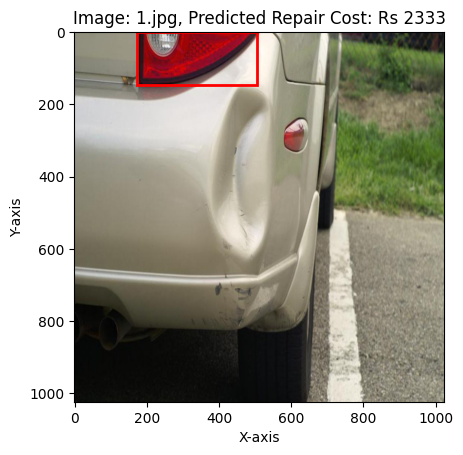

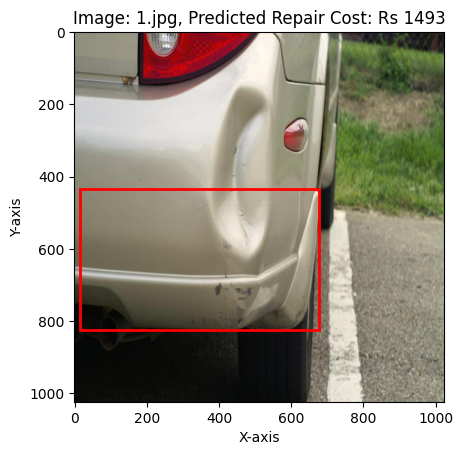

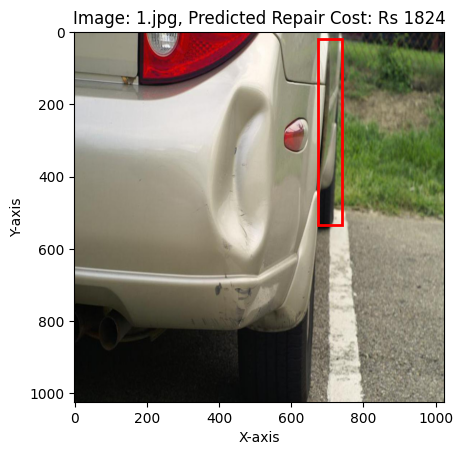

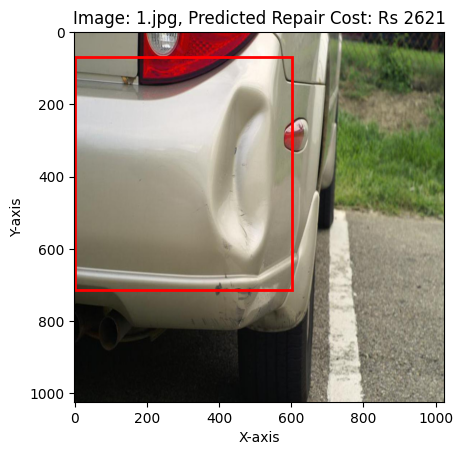

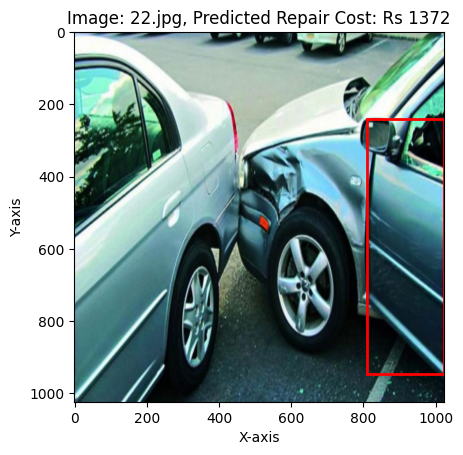

...

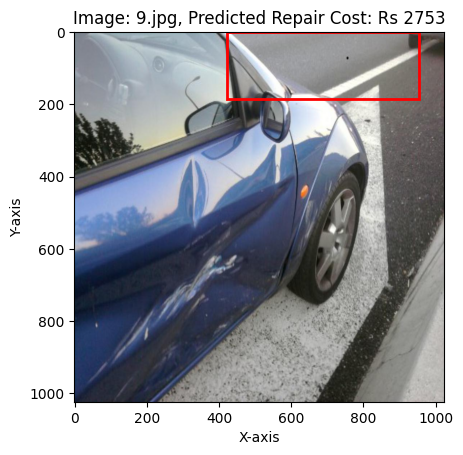

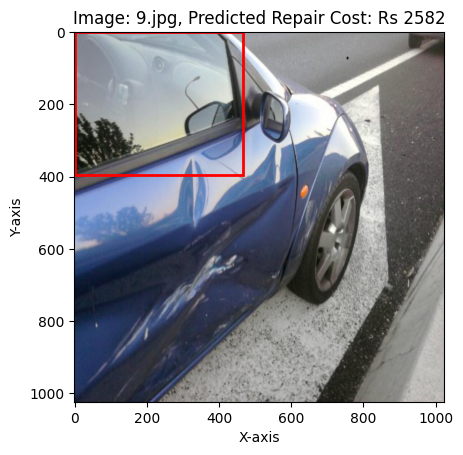

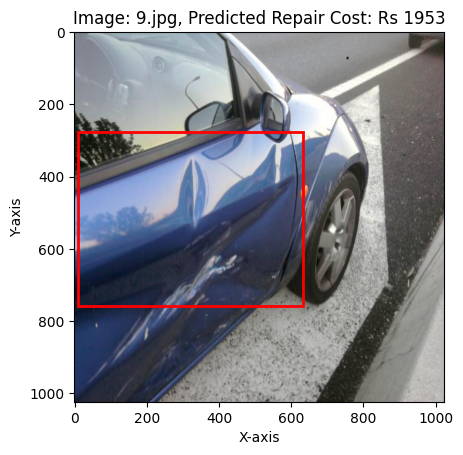

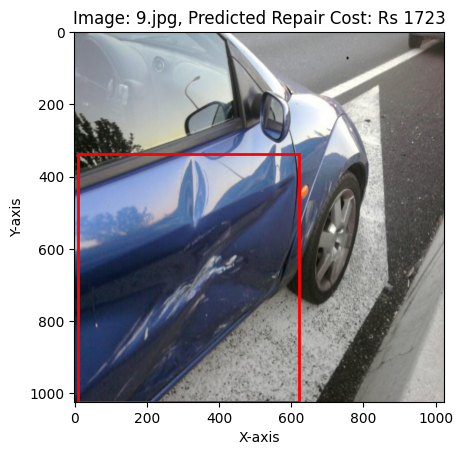

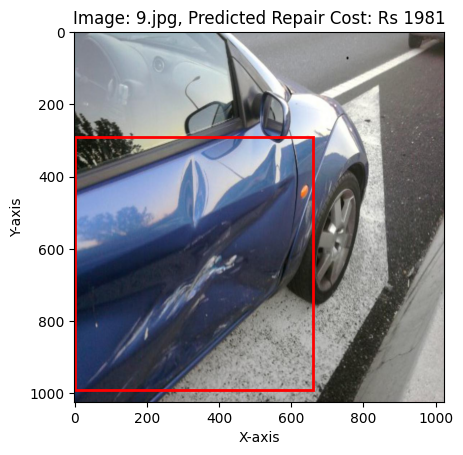

In [ ]:
import matplotlib.pyplot as plt
import matplotlib.patches as patches
from PIL import Image

def visualize_images_with_costs(data):
    for _, row in data.iterrows():
        image_name = row['image_id']
        predicted_box = eval(row['predicted_box'])
        repair_cost = row['predicted_repair_cost']

        # Load the image
        img_path = f"/content/{image_name}"
        img = Image.open(img_path)

        # Create figure and axes
        fig, ax = plt.subplots(1)

        # Display the image
        ax.imshow(img)

        # Add predicted box
        rect = patches.Rectangle((predicted_box[0], predicted_box[1]), predicted_box[2] - predicted_box[0], predicted_box[3] - predicted_box[1],
                                 linewidth=2, edgecolor='r', facecolor='none', label=f'Repair Cost: {repair_cost}')
        ax.add_patch(rect)

        # Set title and labels
        ax.set_title(f"Image: {image_name}, Predicted Repair Cost: Rs {int(repair_cost)}")
        ax.set_xlabel("X-axis")
        ax.set_ylabel("Y-axis")

        # Show the plot
        plt.show()

# Call the function with your test data
visualize_images_with_costs(test_data)


In [ ]:
#import joblib

In [ ]:
#joblib.dump(repair_cost_model, 'repair_cost_model.joblib')

In [ ]:
predicted_costs

array([2333.09223417, 1493.25462794, 1823.70972797, 2620.65230904,
       1371.53245803, 1953.34774055, 1950.18401397,   70.1574701 ,
       2154.58844553,  600.74707548,  600.68489775, 1587.15758761,
       1034.2318116 ,  910.20734093, 1721.50146674, 2696.93853706,
        188.94594597, 2996.55425153, 1255.64225749, 1325.99098009,
       1422.44466753, 2042.90694639,  596.96404577, 1860.84506113,
       2193.83249474, 1453.98608827, 1579.9652445 ,  528.40849673,
        572.32292434,  700.77499314, 2741.88540675, 2306.37199805,
       3122.07357944,   96.40856479,  969.49257409, 1282.32268698,
       1631.69997374,  273.20745834,  455.73661284,  462.03594828,
       1823.94437255, 2047.46508592, 2624.49670735, 1315.58754776,
       2753.41550598, 2582.19927002, 1952.66331611, 1722.80534856,
       1980.96725169])

In [ ]:
test_data

,image_id,category,predicted_box,ground_truth_box,predicted_repair_cost
0,1.jpg,0,"[173.43642, 0, 504.86984, 146.59732]","[[185, 4, 321, 139], [4, 0, 692, 823]]",2333.0
1,1.jpg,1,"[14.038632, 433.3636, 677.90857, 823.8051]","[[185, 4, 321, 139], [4, 0, 692, 823]]",1493.0
2,1.jpg,2,"[673.23663, 18.04082, 740.36884, 533.88416]","[[185, 4, 321, 139], [4, 0, 692, 823]]",1824.0
3,1.jpg,1,"[0, 68.8831, 602.47095, 712.8734]","[[185, 4, 321, 139], [4, 0, 692, 823]]",2621.0
4,22.jpg,2,"[811.5042, 239.94843, 1023.6517, 947.11633]","[[0, 322, 331, 701], [390, 329, 71, 358], [415...",1372.0
5,22.jpg,2,"[11.414102, 82.950424, 291.37256, 1024]","[[0, 322, 331, 701], [390, 329, 71, 358], [415...",1953.0
6,22.jpg,0,"[471.47256, 127.807755, 811.2473, 350.995]","[[0, 322, 331, 701], [390, 329, 71, 358], [415...",1950.0
7,22.jpg,0,"[512.0111, 503.20975, 543.48376, 559.9122]","[[0, 322, 331, 701], [390, 329, 71, 358], [415...",70.0
8,22.jpg,3,"[420.58542, 94.63379, 809.9317, 338.23148]","[[0, 322, 331, 701], [390, 329, 71, 358], [415...",2155.0
9,22.jpg,4,"[454.13025, 407.63995, 591.0052, 686.94415]","[[0, 322, 331, 701], [390, 329, 71, 358], [415...",601.0
